# Hyperparameter Optimization for TFT Using Load Feature Stage

This notebook trains a TFT model for day-ahead electricity price forecasting using a 1-week input window and the load feature stage, which includes all previously introduced features along with electricity load data.

Before training, **hyperparameter optimization is performed** to identify the best model configuration. The model is evaluated across multiple hyperparameter settings, and the best-performing configuration is selected for final evaluation.

The best model's configuration is saved externally as a JSON file in the **"best" folder** to ensure exact reproducibility for future experiments, including transfer learning.

Performance is evaluated using standard error metrics, and visualizations are generated to analyze forecast accuracy.

In [1]:
import pandas as pd


# Load data
train_df = pd.read_csv('~/data/Germany_time_zone/all/train_with_all.csv')
test_df = pd.read_csv('~/data/Germany_time_zone/all/test_with_all.csv')

# Convert to UTC while handling DST ambiguities
train_df['ds'] = pd.to_datetime(train_df['ds']).dt.tz_localize('Europe/Berlin', ambiguous='infer').dt.tz_convert('UTC')
test_df['ds'] = pd.to_datetime(test_df['ds']).dt.tz_localize('Europe/Berlin', ambiguous='infer').dt.tz_convert('UTC')

# Check date ranges
print("First date in train_df:", train_df['ds'].min())
print("Last date in train_df:", train_df['ds'].max())
print("First date in test_df:", test_df['ds'].min())
print("Last date in test_df:", test_df['ds'].max())


calendar_features = ['month_sin', 'month_cos', 'day_of_week_sin', 'day_of_week_cos', 
                     'hour_sin', 'hour_cos', 'is_holiday', 'is_weekend']
gas_price_features = ['gas_price']
load_features = ['load', 'co2_emission_allowances', 'synthetic_price']
renewable_features = ['renewable', 'non_renewable']
cross_border_features = ['cross_border_trading']

# Define the exogenous variable lists
stat_exog_list = [] 
hist_exog_list = (
    calendar_features
    + gas_price_features
    + load_features
    # + renewable_features
    # + cross_border_features
)

futr_exog_list = (
    calendar_features
)



First date in train_df: 2018-09-30 22:00:00+00:00
Last date in train_df: 2023-12-31 22:00:00+00:00
First date in test_df: 2023-12-31 23:00:00+00:00
Last date in test_df: 2024-12-31 22:00:00+00:00


In [2]:
train_df.head()

,ds,y,unique_id,day_of_week,month,hour,is_weekend,is_holiday,month_sin,month_cos,...,day_of_week_cos,hour_sin,hour_cos,gas_price,cross_border_trading,non_renewable,renewable,load,co2_emission_allowances,synthetic_price
0,2018-09-30 22:00:00+00:00,59.53,electricity_prices,0,10,0,0,0,-0.866025,0.5,...,1.0,0.000000,1.000000,26.076,-3352.17,28463.26,12633.01,42928.26,20.3,55.530909
1,2018-09-30 23:00:00+00:00,56.10,electricity_prices,0,10,1,0,0,-0.866025,0.5,...,1.0,0.258819,0.965926,26.076,-3766.75,28254.16,12700.17,41669.59,20.3,55.530909
2,2018-10-01 00:00:00+00:00,51.41,electricity_prices,0,10,2,0,0,-0.866025,0.5,...,1.0,0.500000,0.866025,26.076,-4556.14,28222.05,12732.32,40900.29,20.3,55.530909
3,2018-10-01 01:00:00+00:00,47.38,electricity_prices,0,10,3,0,0,-0.866025,0.5,...,1.0,0.707107,0.707107,26.076,-3055.86,28497.02,12949.38,41735.54,20.3,55.530909
4,2018-10-01 02:00:00+00:00,47.59,electricity_prices,0,10,4,0,0,-0.866025,0.5,...,1.0,0.866025,0.500000,26.076,-2241.89,29026.40,13789.26,43295.32,20.3,55.530909


In [3]:
test_df.head()

,ds,y,unique_id,day_of_week,month,hour,is_weekend,is_holiday,month_sin,month_cos,...,day_of_week_cos,hour_sin,hour_cos,gas_price,cross_border_trading,non_renewable,renewable,load,co2_emission_allowances,synthetic_price
0,2023-12-31 23:00:00+00:00,0.10,electricity_prices,0,1,0,0,1,0.5,0.866025,...,1.0,0.000000,1.000000,31.574,-11728.9125,8378.536596,41778.25343,40170.0900,66.6,84.047273
1,2024-01-01 00:00:00+00:00,0.01,electricity_prices,0,1,1,0,1,0.5,0.866025,...,1.0,0.258819,0.965926,31.574,-11129.9725,8284.442818,41522.96191,38818.1500,66.6,84.047273
2,2024-01-01 01:00:00+00:00,0.00,electricity_prices,0,1,2,0,1,0.5,0.866025,...,1.0,0.500000,0.866025,31.574,-11635.4075,8282.031575,41346.84615,37847.5650,66.6,84.047273
3,2024-01-01 02:00:00+00:00,-0.01,electricity_prices,0,1,3,0,1,0.5,0.866025,...,1.0,0.707107,0.707107,31.574,-11492.7000,8318.301450,40363.41746,37123.2325,66.6,84.047273
4,2024-01-01 03:00:00+00:00,-0.03,electricity_prices,0,1,4,0,1,0.5,0.866025,...,1.0,0.866025,0.500000,31.574,-10593.8850,8309.993639,40234.70911,36753.5150,66.6,84.047273


Train the Model

In [4]:
print(        
    stat_exog_list
      )
print(
    hist_exog_list,
    )
print(    
    futr_exog_list,
     )

[]
['month_sin', 'month_cos', 'day_of_week_sin', 'day_of_week_cos', 'hour_sin', 'hour_cos', 'is_holiday', 'is_weekend', 'gas_price', 'load', 'co2_emission_allowances', 'synthetic_price']
['month_sin', 'month_cos', 'day_of_week_sin', 'day_of_week_cos', 'hour_sin', 'hour_cos', 'is_holiday', 'is_weekend']


In [ ]:
from neuralforecast import NeuralForecast
from neuralforecast.auto import AutoTFT
import optuna

horizon = 24
historical = 24 * 7
validation_size = int(0.1 * len(train_df))
# validation_size = 24 * 30 * 3 # 3 months 

number_of_samples = 10
model_name = 'AutoTFT'

def config(trial):
    h = horizon
    return {
        "stat_exog_list": trial.suggest_categorical("stat_exog_list", [stat_exog_list]),
        "hist_exog_list": trial.suggest_categorical("hist_exog_list", [hist_exog_list]),
        "futr_exog_list": trial.suggest_categorical("futr_exog_list", [futr_exog_list]),
        "input_size": trial.suggest_categorical(
            "input_size",
            # [x * 24 for x in [4, 7, 10, 14, 20]]
            [historical]
        ),
        "max_steps": trial.suggest_int("max_steps", 1000, 10000, step=1000),  # Maximum steps (quantized by 1000)
        "step_size": trial.suggest_categorical("step_size",
                                               [1, h]
                                               # [h]
                                               ),
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-4, 1e-1),  # Learning rate (log-uniform)
        "scaler_type": trial.suggest_categorical("scaler_type", [None, "robust", "standard"]),  # Scaler type
        "batch_size": trial.suggest_categorical("batch_size", [4, 8, 16, 32, 64, 128, 
                                                               # 256
                                                              ]),  # Batch size
        "windows_batch_size": trial.suggest_categorical("windows_batch_size", [
                                                                               4,
                                                                               8,
                                                                               16,
                                                                               32, 
                                                                               64, 
                                                                              ]),  # Windows batch size
        "random_seed": trial.suggest_int("random_seed", 1, 20),  # Random seed

        "hidden_size": trial.suggest_categorical("hidden_size", [32, 64, 128, 
                                                                 256, 
                                                                 # 512 # THIS GETS A MEMORY OVERLOAD ON THE GPUs
                                                                ]),
        "n_head": trial.suggest_categorical("n_head", [2, 4, 8, 
                                                       16,
                                                       32,
                                                      ]),
        
        "grn_activation": trial.suggest_categorical("grn_activation", ["ELU", "ReLU", "Tanh", "Softplus"]),
        # "n_rnn_layers": trial.suggest_int("n_rnn_layers", 1, 10),
        # "rnn_type": trial.suggest_categorical("rnn_type", ["LSTM", "GRU"]),
        # "one_rnn_initial_state": trial.suggest_categorical("one_rnn_initial_state", [True, False]),
    }
    
model = AutoTFT(h=horizon,
                  config=config,
                  search_alg=optuna.samplers.TPESampler(),
                  backend='optuna',
                  num_samples=number_of_samples,
                 )


# Train the model on the entire training data just once
nf = NeuralForecast(models=[model], freq='h')
nf.fit(df=train_df, val_size=validation_size) 

In [6]:
results = nf.models[0].results.trials_dataframe()
results.drop(columns='user_attrs_ALL_PARAMS')

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_futr_exog_list,params_grn_activation,params_hidden_size,params_hist_exog_list,...,params_learning_rate,params_max_steps,params_n_head,params_random_seed,params_scaler_type,params_stat_exog_list,params_step_size,params_windows_batch_size,user_attrs_METRICS,state
0,0,24.090666,2025-03-06 16:54:21.809144,2025-03-06 17:00:28.220486,0 days 00:06:06.411342,128,"[month_sin, month_cos, day_of_week_sin, day_of...",Tanh,64,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.012503,5000,8,1,None,[],1,32,"{'loss': tensor(24.0907), 'train_loss': tensor...",COMPLETE
1,1,22.263624,2025-03-06 17:00:28.222204,2025-03-06 17:04:31.698174,0 days 00:04:03.475970,128,"[month_sin, month_cos, day_of_week_sin, day_of...",ReLU,128,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.000516,4000,4,7,None,[],24,16,"{'loss': tensor(22.2636), 'train_loss': tensor...",COMPLETE
2,2,19.986485,2025-03-06 17:04:31.699982,2025-03-06 17:11:19.212742,0 days 00:06:47.512760,4,"[month_sin, month_cos, day_of_week_sin, day_of...",Softplus,128,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.000285,5000,4,19,standard,[],1,8,"{'loss': tensor(19.9865), 'train_loss': tensor...",COMPLETE
3,3,20.427750,2025-03-06 17:11:19.214555,2025-03-06 17:19:26.591688,0 days 00:08:07.377133,32,"[month_sin, month_cos, day_of_week_sin, day_of...",Softplus,32,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.000392,7000,32,19,standard,[],1,4,"{'loss': tensor(20.4277), 'train_loss': tensor...",COMPLETE
4,4,29.780268,2025-03-06 17:19:26.593606,2025-03-06 17:29:47.942616,0 days 00:10:21.349010,32,"[month_sin, month_cos, day_of_week_sin, day_of...",Tanh,256,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.033461,10000,32,16,standard,[],24,4,"{'loss': tensor(29.7803), 'train_loss': tensor...",COMPLETE
5,5,20.477177,2025-03-06 17:29:47.944378,2025-03-06 17:36:52.755285,0 days 00:07:04.810907,4,"[month_sin, month_cos, day_of_week_sin, day_of...",ReLU,32,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.000216,6000,32,19,robust,[],1,8,"{'loss': tensor(20.4772), 'train_loss': tensor...",COMPLETE
6,6,24.809626,2025-03-06 17:36:52.756986,2025-03-06 17:41:02.703379,0 days 00:04:09.946393,4,"[month_sin, month_cos, day_of_week_sin, day_of...",ELU,64,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.001236,4000,8,15,standard,[],24,32,"{'loss': tensor(24.8096), 'train_loss': tensor...",COMPLETE
7,7,48.326385,2025-03-06 17:41:02.705073,2025-03-06 17:50:13.702881,0 days 00:09:10.997808,16,"[month_sin, month_cos, day_of_week_sin, day_of...",Softplus,128,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.032418,6000,4,5,None,[],24,64,"{'loss': tensor(48.3264), 'train_loss': tensor...",COMPLETE
8,8,32.100548,2025-03-06 17:50:13.704645,2025-03-06 17:55:41.411608,0 days 00:05:27.706963,8,"[month_sin, month_cos, day_of_week_sin, day_of...",ELU,256,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.018654,3000,16,3,standard,[],24,32,"{'loss': tensor(32.1005), 'train_loss': tensor...",COMPLETE
9,9,21.184410,2025-03-06 17:55:41.413404,2025-03-06 17:59:37.258483,0 days 00:03:55.845079,32,"[month_sin, month_cos, day_of_week_sin, day_of...",Tanh,32,"[month_sin, month_cos, day_of_week_sin, day_of...",...,0.000462,4000,4,12,standard,[],24,16,"{'loss': tensor(21.1844), 'train_loss': tensor...",COMPLETE


In [7]:
nf.models[0].results.best_trial.user_attrs["ALL_PARAMS"]

{'stat_exog_list': [],
 'hist_exog_list': ['month_sin',
  'month_cos',
  'day_of_week_sin',
  'day_of_week_cos',
  'hour_sin',
  'hour_cos',
  'is_holiday',
  'is_weekend',
  'gas_price',
  'load',
  'co2_emission_allowances',
  'synthetic_price'],
 'futr_exog_list': ['month_sin',
  'month_cos',
  'day_of_week_sin',
  'day_of_week_cos',
  'hour_sin',
  'hour_cos',
  'is_holiday',
  'is_weekend'],
 'input_size': 168,
 'max_steps': 5000,
 'step_size': 1,
 'learning_rate': 0.0002849670072230568,
 'scaler_type': 'standard',
 'batch_size': 4,
 'windows_batch_size': 8,
 'random_seed': 19,
 'hidden_size': 128,
 'n_head': 4,
 'grn_activation': 'Softplus',
 'h': 24,
 'loss': MAE(),
 'valid_loss': MAE()}

In [8]:
# Optuna
best_config = nf.models[0].results.best_trial.user_attrs["ALL_PARAMS"]

historical = best_config["input_size"]
print(historical)

168


In [9]:
import json

# Let's say you have your best params dictionary
best_params = nf.models[0].results.best_trial.user_attrs["ALL_PARAMS"]

# Remove non-serializable keys (e.g., the loss objects)
best_params.pop('loss', None)
best_params.pop('valid_loss', None)

# Save it to a JSON file
with open("../best/best_config_load.json", "w") as f:
    json.dump(best_params, f, indent=4)

In [10]:
print('done with hyperparameter optimisation')

done with hyperparameter optimisation


Test the model

In [11]:
import pandas as pd

def fill_with_last_week_value(
        forecast_input_data: pd.DataFrame,
        feature: str,
        forecasting_time: pd.Timestamp,
        known_up_to: pd.Timedelta = None
):
    """
    For each row in forecast_input_data, if the row's ds is beyond the feature's 'known_up_to' relative
    to issue_time, we fill the value with the same hour from last week (ds-7d) found in main_df.

    :param forecast_input_data:  The 24h window for day D we are about to forecast.
    :param feature: Which column to fill.
    :param forecasting_time: The date/time we are issuing the forecast.
    :param known_up_to: How far before/after issue_time the feature is known. 
                        If < 0 then before otherwise after.
                        If None => we treat everything after issue_time as unknown.
    :return: A copy of fut_df with the 'feature' column updated.
    """
    # Copy so we don't modify in-place
    forecast_input_data = forecast_input_data.copy()

    if known_up_to is None:
        # Means: if ds > forecasting_time => unknown
        mask_unknown = forecast_input_data['ds'] > forecasting_time
    else:
        # Means: if ds > (forecasting_time + known_up_to) => unknown
        mask_unknown = forecast_input_data['ds'] > (forecasting_time + known_up_to)

    # We'll fill unknown slots from "ds - 7 days" in test_df
    for idx in forecast_input_data[mask_unknown].index:
        target_ds = forecast_input_data.loc[idx, 'ds']
        ds_week_ago = target_ds - pd.Timedelta(days=7)

        # Attempt to find the row in test_df for ds_week_ago
        row_week_ago = test_df.loc[test_df['ds'] == ds_week_ago]

        if not row_week_ago.empty:
            # Fill with that value
            forecast_input_data.at[idx, feature] = row_week_ago[feature].values[0]
        # else:
        #     # If we can't find an exact match, fallback or leave as is
        #     # (could do interpolation or an average)
        #     # Here we fallback to the existing value or fill zero
        #     forecast_input_data.at[idx, feature] = 0

    return forecast_input_data


In [ ]:
import pytz

# Define Germany timezone
germany_tz = pytz.timezone("Europe/Berlin")


historical = best_config["input_size"]
print(historical)

# 2) Prediction Loop
daterange = pd.date_range(
    start=test_df['ds'].min(),
    end=test_df['ds'].max() - pd.Timedelta(hours=historical),
    freq='24H',
)

predictions = []

for d in daterange:
    day_start = d
    day_end = d + pd.Timedelta(hours=historical)

    # 2.1) Gather input data based on historical
    input_data = test_df[(test_df['ds'] >= day_start) & (test_df['ds'] < day_end)].copy()
    if input_data.empty:
        continue

    # 2.2) Define the "forecasting_time" = day_end 11:00 o'clock
    # Calculate issue time in Germany time
    issue_time_germany = day_end.astimezone(germany_tz).replace(hour=11, minute=0, second=0)

    # Convert back to UTC for consistency
    issue_time = issue_time_germany.astimezone(pytz.UTC)

    # 2.3) Fill unknown features
    # Example: load known up to (forecasting_time - 2h),
    #          gas_price known for the entire day,
    #          co2_emissions known only up to forecasting_time, etc.
    input_data = fill_with_last_week_value(input_data, 'load', issue_time,
                                           known_up_to=-pd.Timedelta(hours=2))
    # input_data = fill_with_last_week_value(input_data, 'co2_emissions', issue_time, known_up_to=None)
    # input_data = fill_with_last_week_value(input_data, 'synthetic_price', issue_time, 
    #                                        known_up_to=-pd.Timedelta(hours=2))
    # If 'gas_price' is fully known for day d at d-1 00:00 => no fill needed
    # but if you do want to fill any missing, you could:
    # forecast_input_data = fill_with_last_week_value(forecast_input_data, test_df, 'gas_price', forecasting_time, known_up_to=pd.Timedelta(hours=24))

    future_data = test_df[(test_df['ds'] >= day_end)]
    # 2.4) Predict
    prediction = nf.predict(df=input_data, futr_df=future_data)

    # Append predictions for evaluation
    predictions.append(prediction)

# Flatten the predictions into a DataFrame
forecast_df = pd.concat(predictions, ignore_index=True)

# Ensure the results align with the test dataset
forecast_df = forecast_df[['ds', model_name]].merge(test_df[['ds', 'y']], on='ds', how='inner')
forecast_df.rename(columns={'y': 'y_actual', model_name: 'y_pred'}, inplace=True)

# Change back to CEST
forecast_df['ds'] = forecast_df['ds'].dt.tz_convert('Europe/Berlin')


In [13]:
forecast_df.head()

,ds,y_pred,y_actual
0,2024-01-08 00:00:00+01:00,84.394455,87.02
1,2024-01-08 01:00:00+01:00,81.288857,84.32
2,2024-01-08 02:00:00+01:00,78.671532,81.82
3,2024-01-08 03:00:00+01:00,77.407539,79.11
4,2024-01-08 04:00:00+01:00,78.574013,78.48


In [14]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Calculate error metrics
mae = mean_absolute_error(forecast_df['y_actual'], forecast_df['y_pred'])
mse = mean_squared_error(forecast_df['y_actual'], forecast_df['y_pred'])
rmse = np.sqrt(mse)

# Print the results
print("Model Performance:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")

# Merge forecasted values with actual test data, selecting only the relevant columns
comparison_df = forecast_df[['ds', 'y_pred']].merge(test_df[['ds', 'y']], on='ds', how='inner')
comparison_df.rename(columns={'y': 'y_actual', 'y_pred': 'y_pred'}, inplace=True)

# Add a column for the day of the week (0=Monday, 1=Tuesday, ..., 6=Sunday)
comparison_df['day_of_week'] = comparison_df['ds'].dt.dayofweek

# Calculate and display MAE, MSE, and RMSE for each day of the week
metrics_by_day = {}

for day in range(7):
    # Filter data for each day of the week
    day_data = comparison_df[comparison_df['day_of_week'] == day]

    # Calculate the metrics for this day
    mae = mean_absolute_error(day_data['y_actual'], day_data['y_pred'])
    mse = mean_squared_error(day_data['y_actual'], day_data['y_pred'])
    rmse = np.sqrt(mse)

    # Store the metrics for each day
    metrics_by_day[day] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    }

# Optionally, you can store these results in a DataFrame for easy viewing or further analysis
metrics_df = pd.DataFrame(metrics_by_day).T
print("\nMetrics by Day of the Week:")
print(metrics_df)

Model Performance:
Mean Absolute Error (MAE): 20.51
Mean Squared Error (MSE): 1287.66
Root Mean Squared Error (RMSE): 35.88

Metrics by Day of the Week:
         MAE          MSE       RMSE
0  20.104734   973.510386  31.201128
1  20.739466  1321.714285  36.355389
2  21.864885  2123.550323  46.081996
3  22.222126  2369.378669  48.676264
4  18.021986   734.885904  27.108779
5  19.524309   665.608218  25.799384
6  21.063172   830.433785  28.817248


Plots

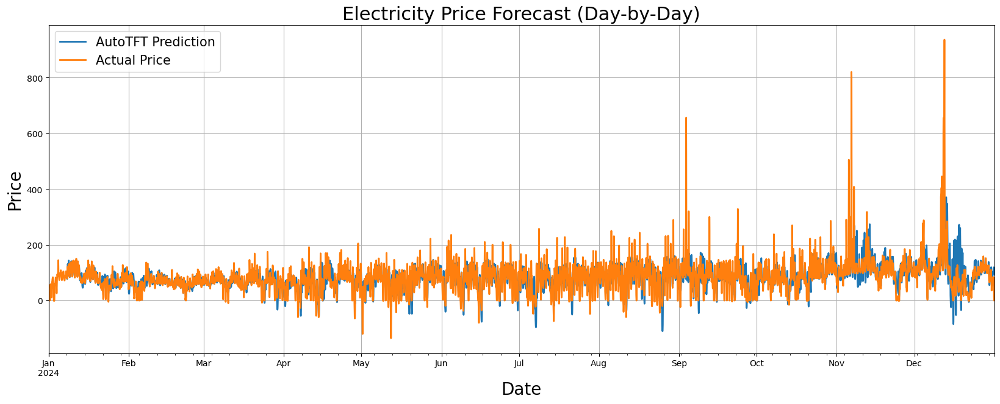

In [15]:
import matplotlib.pyplot as plt

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(20, 7))

# Plot predictions for model
forecast_df.set_index('ds')['y_pred'].plot(ax=ax, linewidth=2, label= f'{model_name} Prediction')

# Optional: Plot actual test values for comparison
test_df.set_index('ds')['y'].plot(ax=ax, linewidth=2, label='Actual Price')

# Formatting the plot
ax.set_title('Electricity Price Forecast (Day-by-Day)', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Date', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()
plt.show()

/scratch/slurm_tmpdir/job_25362377/ipykernel_139304/644738538.py:9: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  unique_months = forecast_df['ds'].dt.to_period('M').unique()
/scratch/slurm_tmpdir/job_25362377/ipykernel_139304/644738538.py:20: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  forecast_month = forecast_df[forecast_df['ds'].dt.to_period('M') == month]
/scratch/slurm_tmpdir/job_25362377/ipykernel_139304/644738538.py:21: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  test_month = test_df[test_df['ds'].dt.to_period('M') == month]


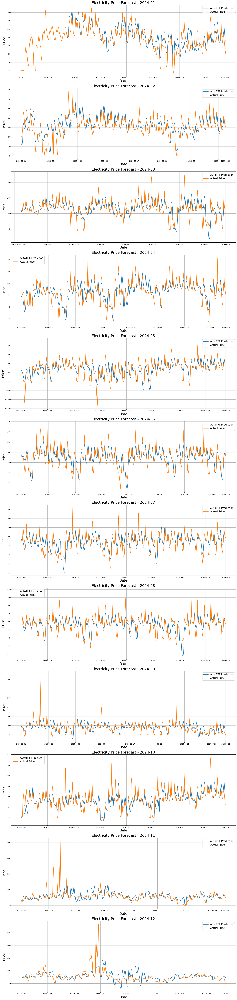

In [16]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'ds' is in datetime format
forecast_df['ds'] = pd.to_datetime(forecast_df['ds'])
test_df['ds'] = pd.to_datetime(test_df['ds'])

# Create a new figure with multiple subplots, one for each month
unique_months = forecast_df['ds'].dt.to_period('M').unique()

# Set up the figure and axes for plotting
fig, axes = plt.subplots(len(unique_months), 1, figsize=(20, 7 * len(unique_months)))

if len(unique_months) == 1:
    axes = [axes]  # Ensure axes is iterable even if there's only one subplot

for i, month in enumerate(unique_months):
    # Create the data subset for the current month
    month_str = str(month)
    forecast_month = forecast_df[forecast_df['ds'].dt.to_period('M') == month]
    test_month = test_df[test_df['ds'].dt.to_period('M') == month]

    # Plot predictions for the current month
    axes[i].plot(forecast_month['ds'], forecast_month['y_pred'], linewidth=2, label=f'{model_name} Prediction')

    # Plot actual test values for comparison in the current month
    axes[i].plot(test_month['ds'], test_month['y'], linewidth=2, label='Actual Price')

    # Formatting the plot for the current month
    axes[i].set_title(f'Electricity Price Forecast - {month_str}', fontsize=22)
    axes[i].set_ylabel('Price', fontsize=20)
    axes[i].set_xlabel('Date', fontsize=20)
    axes[i].legend(prop={'size': 15})
    axes[i].grid()

# Show the plot
plt.tight_layout()
plt.show()

In [17]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'ds' is in datetime format
forecast_df['ds'] = pd.to_datetime(forecast_df['ds'])
test_df['ds'] = pd.to_datetime(test_df['ds'])

# Create a new figure with multiple subplots, one for each biweekly period
# Group the data by biweekly periods
forecast_df['biweek'] = forecast_df['ds'].dt.to_period('2W')
test_df['biweek'] = test_df['ds'].dt.to_period('2W')

# Get the unique biweekly periods
unique_biweeks = forecast_df['biweek'].unique()

# Set up the figure and axes for plotting
fig, axes = plt.subplots(len(unique_biweeks), 1, figsize=(20, 7 * len(unique_biweeks)))

if len(unique_biweeks) == 1:
    axes = [axes]  # Ensure axes is iterable even if there's only one subplot

for i, biweek in enumerate(unique_biweeks):
    # Create the data subset for the current biweekly period
    biweek_str = str(biweek)
    forecast_biweek = forecast_df[forecast_df['biweek'] == biweek]
    test_biweek = test_df[test_df['biweek'] == biweek]

    # Plot predictions for the current biweekly period
    axes[i].plot(forecast_biweek['ds'], forecast_biweek['y_pred'], linewidth=2, label=f'{model_name} Prediction')

    # Plot actual test values for comparison in the current biweekly period
    axes[i].plot(test_biweek['ds'], test_biweek['y'], linewidth=2, label='Actual Price')

    # Formatting the plot for the current biweekly period
    axes[i].set_title(f'Electricity Price Forecast - {biweek_str}', fontsize=22)
    axes[i].set_ylabel('Price', fontsize=20)
    axes[i].set_xlabel('Date', fontsize=20)
    axes[i].legend(prop={'size': 15})
    axes[i].grid()

# Show the plot
plt.tight_layout()
plt.show()

/scratch/slurm_tmpdir/job_25362377/ipykernel_139304/1878128762.py:10: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  forecast_df['biweek'] = forecast_df['ds'].dt.to_period('2W')
/scratch/slurm_tmpdir/job_25362377/ipykernel_139304/1878128762.py:11: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  test_df['biweek'] = test_df['ds'].dt.to_period('2W')
